# Road Damage Detection EDA
This notebook performs Exploratory Data Analysis (EDA) on the road damage detection dataset.

## Prerequisites
Make sure to install the following packages if they are not already installed:

In [ ]:
!pip install seaborn matplotlib pandas numpy opencv-python-headless tqdm scipy imagehash gdown

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cv2
import os
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm
import xml.etree.ElementTree as ET
import glob
from scipy.stats import shapiro, spearmanr, wilcoxon
from PIL import Image
import imagehash
import gdown
import zipfile

## Download and Extract Dataset

In [ ]:
data_root_dir = "../data-collection"

# Check if data-collection folder exists in the parent directory, create if it doesn't
if not os.path.exists(data_root_dir):
    os.makedirs(data_root_dir)

# Check if directories exist
assert os.path.exists(data_root_dir), f"Data directory does not exist: {data_root_dir}"

# Define the Google Drive file ID and destination paths
file_id = '1GB4RUpJjtkEb2A94bnK1crMMhTg3Yc-9'
download_path = '../data-collection/rdd_dataset.zip'
extract_path = '../data-collection/'

# Step 1: Download the ZIP file from Google Drive
gdown.download(f'https://drive.google.com/uc?id={file_id}', download_path, quiet=False)

# Step 2: Extract the ZIP file
with zipfile.ZipFile(download_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extraction complete")

## Load Data

In [16]:
# Sample paths (replace with actual paths)
mode = "filtered"
image_destination_path = os.path.join(data_root_dir, mode, "images")
annot_destination_path = os.path.join(data_root_dir, mode, "annotations")

# Check if directories exist
assert os.path.exists(image_destination_path), f"Image directory does not exist: {image_destination_path}"
assert os.path.exists(annot_destination_path), f"Annotation directory does not exist: {annot_destination_path}"

# Get List of image and annotation files
image_list = glob.glob(image_destination_path + "/*.jpg")
annot_list = glob.glob(annot_destination_path + "/*.xml")

# Check if paths are fetched correctly
def check_paths(image_list, annot_list):
    # Check number of files fetched
    num_images = len(image_list)
    num_annotations = len(annot_list)
    print(f"Number of images fetched: {num_images}")
    print(f"Number of annotations fetched: {num_annotations}")

# Run the path check
check_paths(image_list, annot_list)

Number of images fetched: 4927
Number of annotations fetched: 4927


## Create Dataframe

In [17]:
def read_and_parse_xml(xml_file_path):
    tree = ET.parse(xml_file_path)
    root = tree.getroot()
    return root

def encoded_obj_annotations(annotations):
    objects_names = []
    for obj in annotations.findall('object'):
        label_code = obj.find('name').text
        objects_names.append(label_code)
    return objects_names

def process_annotation_file(xml_file_path):
    annotations = read_and_parse_xml(xml_file_path)
    objects_names = encoded_obj_annotations(annotations)
    return xml_file_path, objects_names

def process_all_annotations(xml_files):
    results = []
    with ThreadPoolExecutor() as executor:
        future_to_xml = {executor.submit(process_annotation_file, xml_file): xml_file for xml_file in xml_files}
        for future in tqdm(as_completed(future_to_xml), total=len(future_to_xml), desc="Processing files"):
            xml_file = future_to_xml[future]
            try:
                xml_file_path, objects_names = future.result()
                results.append((xml_file_path, objects_names))
            except Exception as exc:
                print(f"{xml_file} generated an exception: {exc}")
    return results

results = process_all_annotations(annot_list)

# Create DataFrame
df = pd.DataFrame(results, columns=['xml_file_path', 'objects'])

# Create columns for each Label with binary encoding
label_map = {
    "D00": "Longitudinal Crack",
    "D10": "Transverse Crack",
    "D20": "Alligator Crack",
    "D40": "Rutting, bump, pothole, separation"
}

for label in label_map.keys():
    df[label] = df['objects'].apply(lambda x: x.count(label))

# Filter the dataset to include only specific Labels
include_labels = {"D00", "D10", "D20", "D40"}
df_filtered = df[df["objects"].apply(lambda x: bool(include_labels.intersection(set(x))))]

df_filtered.head()

Processing files: 100%|██████████████████████████████████████████████████████████████████████████████████████| 4927/4927 [00:03<00:00, 1287.95it/s]


,xml_file_path,objects,D00,D10,D20,D40
0,../data-collection\filtered\annotations\Japan_...,[D00],1,0,0,0
1,../data-collection\filtered\annotations\Japan_...,[D20],0,0,1,0
2,../data-collection\filtered\annotations\Japan_...,"[D20, D20, D00, D10]",1,1,2,0
3,../data-collection\filtered\annotations\Japan_...,[D20],0,0,1,0
4,../data-collection\filtered\annotations\Japan_...,[D20],0,0,1,0


## Removing Data with Invalid or Missing Labels

In [18]:
def has_valid_labels(annotations):
    for obj in annotations.findall('object'):
        label = obj.find('name').text
        if label in include_labels:
            return True
    return False

# Identify and remove images with no valid labels
images_with_valid_labels = []
annotations_with_valid_labels = []
removed_count = 0

valid_xml_files = set()

for img_file, xml_file in zip(image_list, annot_list):
    annotations = read_and_parse_xml(xml_file)
    if annotations.findall('object'):  # Check if there are any labels
        if has_valid_labels(annotations):
            images_with_valid_labels.append(img_file)
            annotations_with_valid_labels.append(xml_file)
            valid_xml_files.add(xml_file)
        else:
            removed_count += 1
    else:
        removed_count += 1

# Print the number of removed items
print(f"Number of removed items: {removed_count}")

# Print the number of remaining items
print(f"Number of remaining images: {len(images_with_valid_labels)}")
print(f"Number of remaining annotations: {len(annotations_with_valid_labels)}")

# Save or use the filtered lists as needed
image_list = images_with_valid_labels
annot_list = annotations_with_valid_labels

# Filter the DataFrame to include only valid XML files
df_filtered = df_filtered[df_filtered['xml_file_path'].isin(valid_xml_files)]

# Map xml file paths to image file paths
df_filtered['image_path'] = df_filtered['xml_file_path'].apply(lambda x: x.replace('annotations', 'images').replace('.xml', '.jpg'))

Number of removed items: 794
Number of remaining images: 4133
Number of remaining annotations: 4133


- In the initial dataset, there were a total of 4927 images and their corresponding annotations. During the data cleaning process, we identified and removed images that either had no labels or could not be properly loaded. After filtering out these invalid data points, the dataset was reduced to 4133 valid images and annotations.

## Class Distribution

C:\Users\flag8\AppData\Local\Temp\ipykernel_32448\2474186767.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts.values, palette="viridis")


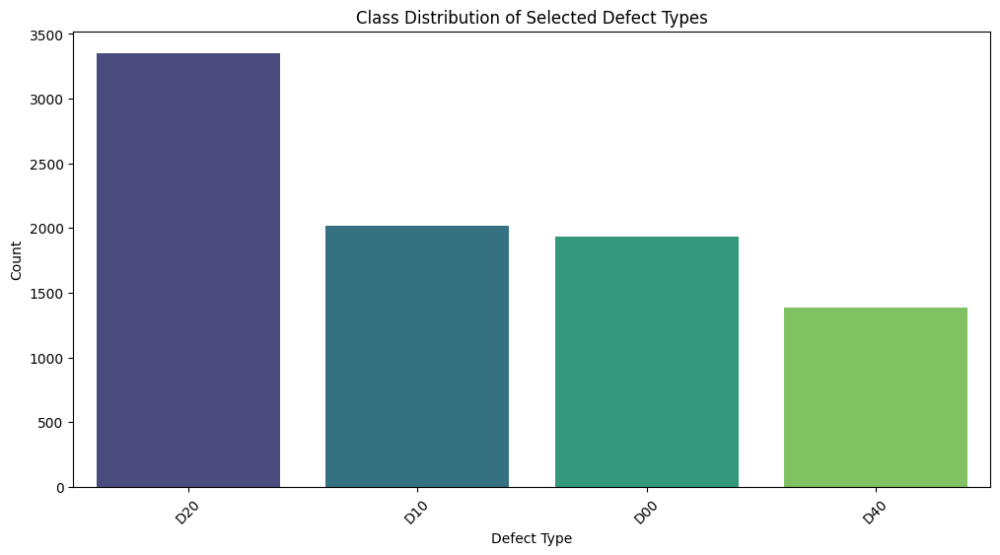

In [19]:
# Plotting class distribution
def plot_class_distribution(df, label_map):
    class_counts = df[label_map.keys()].sum().sort_values(ascending=False)
    plt.figure(figsize=(12, 6))
    sns.barplot(x=class_counts.index, y=class_counts.values, palette="viridis")
    plt.title("Class Distribution of Selected Defect Types")
    plt.xlabel("Defect Type")
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.show()

plot_class_distribution(df_filtered, label_map)

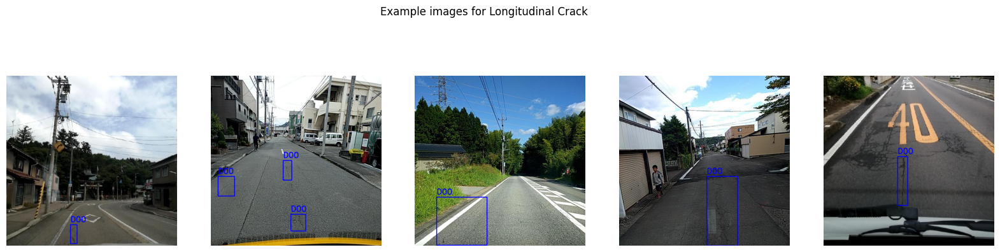

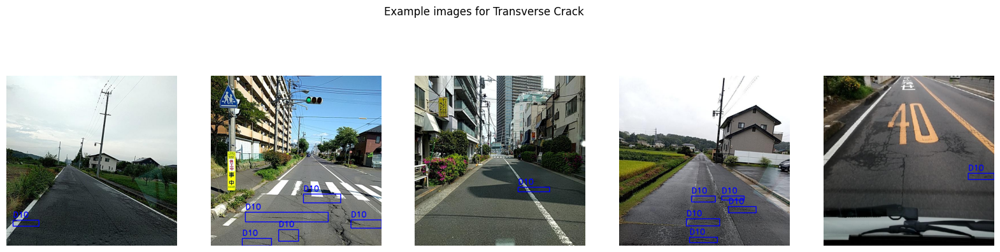

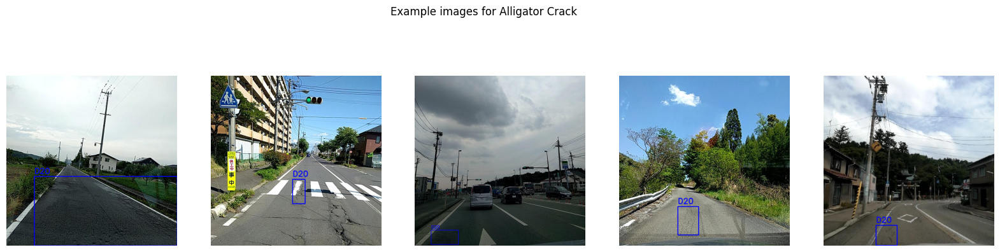

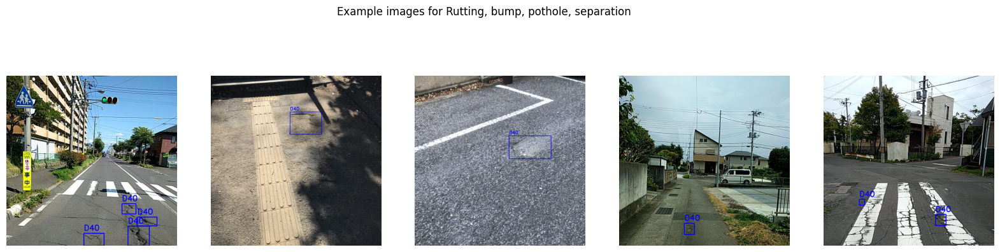

In [61]:
def get_images_and_annotations_for_label(df, label, num_examples=5):
    # Get paths of images and corresponding annotations that contain the specified label
    image_paths = df[df[label] > 0]['image_path'].tolist()
    xml_paths = df[df[label] > 0]['xml_file_path'].tolist()
    return image_paths[:num_examples], xml_paths[:num_examples]

def draw_bounding_boxes_for_label(image_path, xml_path, target_label):
    image = cv2.imread(image_path)
    annotations = read_and_parse_xml(xml_path)
    for obj in annotations.findall('object'):
        label = obj.find('name').text
        if label == target_label:
            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
            cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def plot_example_images_with_bboxes(df, label_map, num_examples=5):
    for label in label_map.keys():
        image_paths, xml_paths = get_images_and_annotations_for_label(df, label, num_examples)
        fig, axes = plt.subplots(1, num_examples, figsize=(20, 5))
        for ax, img_path, xml_path in zip(axes, image_paths, xml_paths):
            img_with_boxes = draw_bounding_boxes_for_label(img_path, xml_path, label)
            ax.imshow(img_with_boxes)
            ax.axis('off')
        plt.suptitle(f"Example images for {label_map[label]}")
        plt.show()

plot_example_images_with_bboxes(df_filtered, label_map)


### Class Distribution of Selected Defect Types

The bar plot shows the distribution of different road defect types in the dataset. The x-axis represents the defect types, and the y-axis represents the count of each defect type. Here is a brief explanation of each defect type:

- **D00 (Longitudinal Crack):** These are cracks that run parallel to the direction of the road, often caused by thermal expansion and contraction or reflective cracking.
- **D10 (Transverse Crack):** These are cracks that run perpendicular to the direction of the road, typically caused by thermal contraction, shrinkage, or traffic load.
- **D20 (Alligator Crack):** Also known as fatigue cracking, these are interconnected cracks that form a pattern resembling an alligator's skin. They are usually caused by repeated traffic loading.
- **D40 (Rutting, bump, pothole, separation):** This category includes various types of surface deformations such as rutting (depressions in the wheel paths), bumps, potholes (holes in the pavement), and separations (disjointed pavement sections).

The distribution shows that Alligator Cracks (D20) are the most common defect type, followed by Transverse Cracks (D10), Longitudinal Cracks (D00), and finally Rutting/Bump/Pothole/Separation (D40). Understanding the distribution of these defect types helps in tailoring detection models to prioritize the most common issues, thereby improving maintenance strategies and road safety.

## Image Dimension Analysis

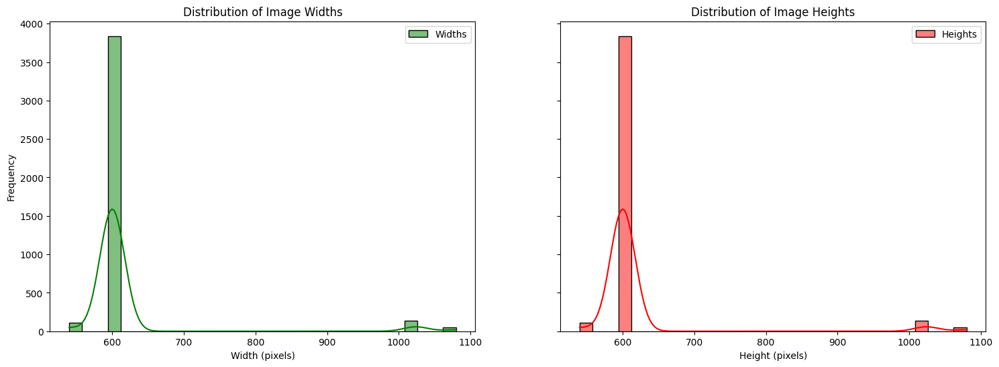

In [20]:
image_dims = []
for img_file in image_list:
    image = cv2.imread(img_file)
    if image is not None:
        h, w, _ = image.shape
        image_dims.append((w, h))

img_widths, img_heights = zip(*image_dims)

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)
sns.histplot(img_widths, bins=30, kde=True, color='green', label='Widths', ax=axes[0])
axes[0].set_title("Distribution of Image Widths")
axes[0].set_xlabel("Width (pixels)")
axes[0].set_ylabel("Frequency")
axes[0].legend()

sns.histplot(img_heights, bins=30, kde=True, color='red', label='Heights', ax=axes[1])
axes[1].set_title("Distribution of Image Heights")
axes[1].set_xlabel("Height (pixels)")
axes[1].legend()

plt.show()

- Both distributions are centered around the same value, indicating that the images in the dataset have consistent dimensions for width and height.
- Most images in the dataset have dimensions of 600x600 pixels. Since we plan to use a pretrained model that requires a specific image size, it will be necessary to resize the images to match the required dimensions.

## Bounding Box Analysis

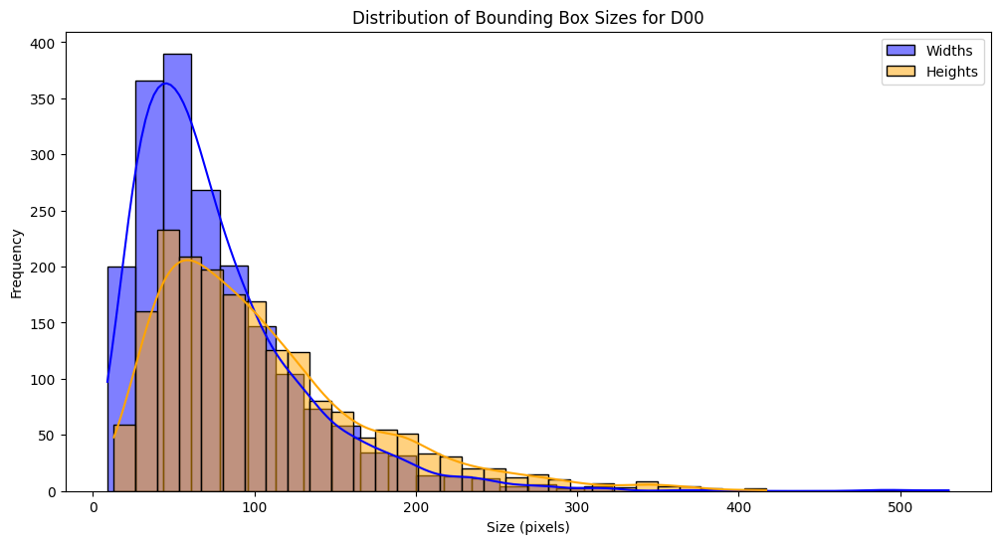

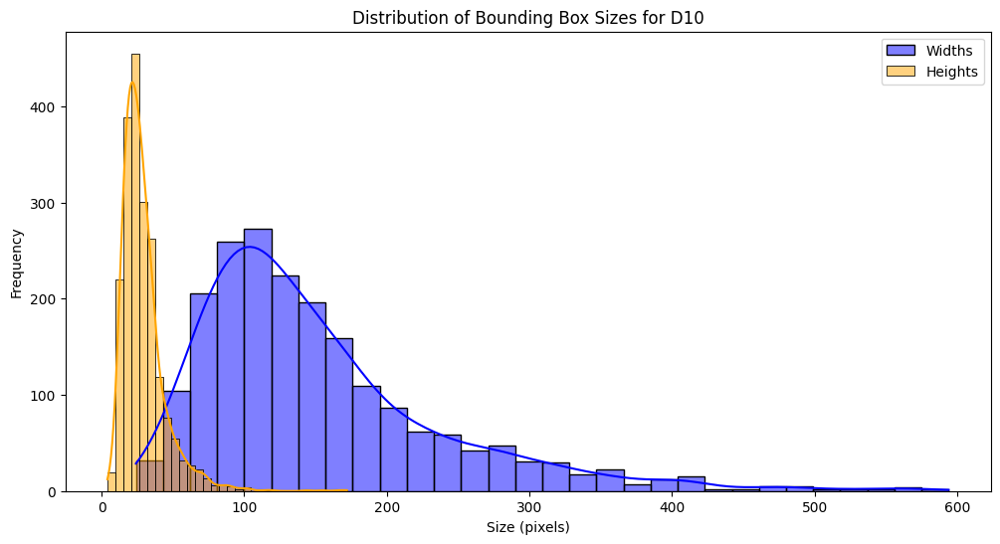

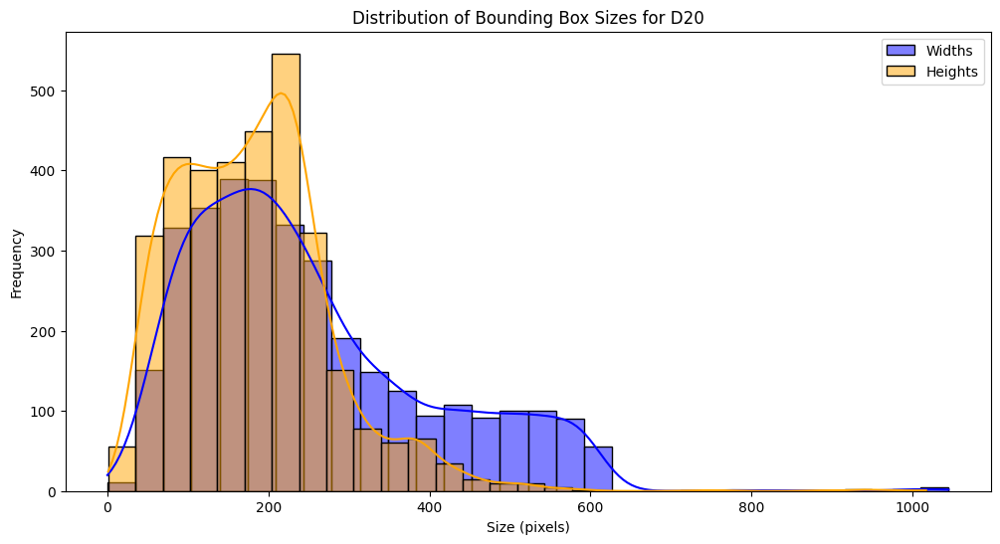

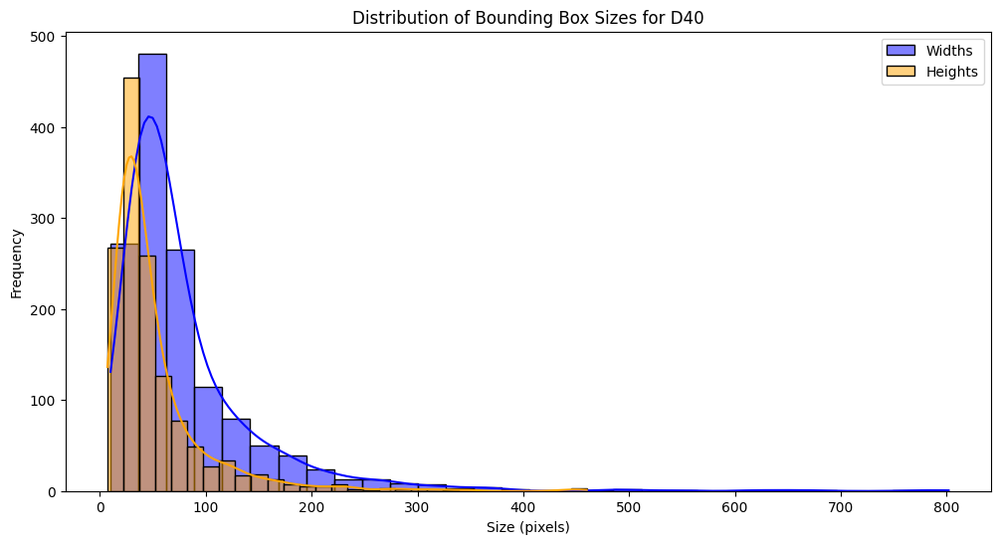

In [11]:
include_labels = ["D00", "D10", "D20", "D40"]

def read_and_parse_xml(xml_file_path):
    tree = ET.parse(xml_file_path)
    root = tree.getroot()
    return root

def get_bounding_box_sizes(annotations):
    sizes_by_label = {label: [] for label in include_labels}
    for obj in annotations.findall('object'):
        label = obj.find('name').text
        if label in include_labels:
            bndbox = obj.find('bndbox')
            width = int(bndbox.find('xmax').text) - int(bndbox.find('xmin').text)
            height = int(bndbox.find('ymax').text) - int(bndbox.find('ymin').text)
            sizes_by_label[label].append((width, height))
    return sizes_by_label

all_sizes_by_label = {label: [] for label in include_labels}
for xml_file in annot_list:
    annotations = read_and_parse_xml(xml_file)
    sizes_by_label = get_bounding_box_sizes(annotations)
    for label, sizes in sizes_by_label.items():
        all_sizes_by_label[label].extend(sizes)

# Plotting the distributions for each label separately
for label in include_labels:
    sizes = all_sizes_by_label[label]
    if sizes:  # Check if there are sizes for the label
        box_widths, box_heights = zip(*sizes)
        plt.figure(figsize=(12, 6))
        sns.histplot(box_widths, bins=30, kde=True, color='blue', label='Widths')
        sns.histplot(box_heights, bins=30, kde=True, color='orange', label='Heights')
        plt.title(f"Distribution of Bounding Box Sizes for {label}")
        plt.xlabel("Size (pixels)")
        plt.ylabel("Frequency")
        plt.legend()
        plt.show()

1. Distribution of Bounding Box Sizes for D00
- The bounding box widths for D00 are predominantly in the range of 50 to 150 pixels, with a peak around 70 pixels.
- The heights are also mostly in the range of 50 to 150 pixels, with a slightly broader distribution than the widths.

2. Distribution of Bounding Box Sizes for D10
- The widths for D10 are more spread out compared to D00, with a noticeable peak around 50 pixels, and a long tail extending up to 400 pixels.
- Heights show a sharp peak around 30 pixels, indicating that D10 defects are generally narrow but can vary significantly in width.

3. Distribution of Bounding Box Sizes for D20
- D20 defects have a wider range of bounding box sizes, with widths commonly falling between 100 to 300 pixels and heights showing a similar pattern.
- There are a few instances of bounding boxes with heights and widths extending up to 600 pixels, indicating some large defects in this category.

4. Distribution of Bounding Box Sizes for D40
- D40 defects show a distribution similar to D00 and D10 but with a more spread out pattern, especially in widths, which can go up to 300 pixels.
- Heights are generally smaller, with a peak around 50 pixels but extending up to 200 pixels.

## Annotation Density

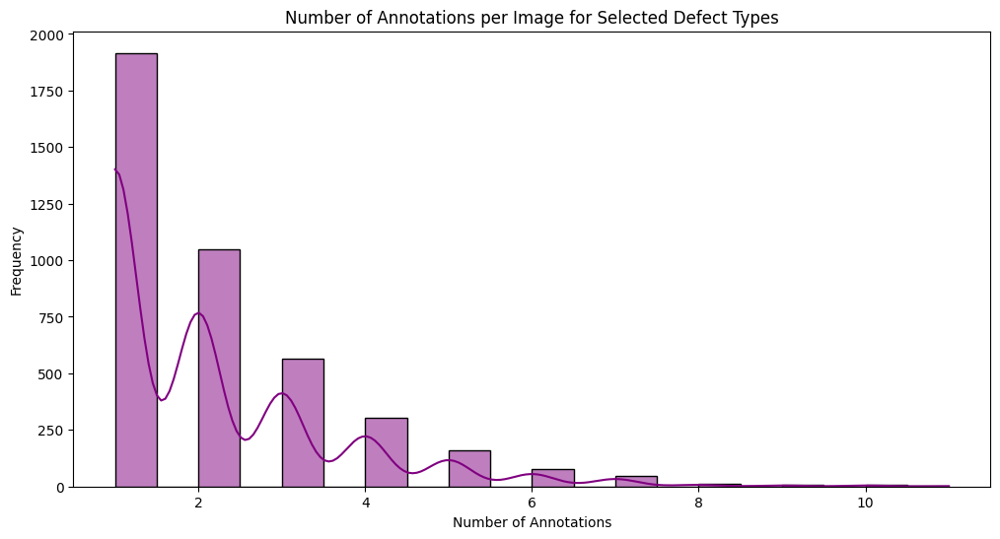

In [22]:
annotation_counts = df_filtered[label_map.keys()].sum(axis=1)
plt.figure(figsize=(12, 6))
sns.histplot(annotation_counts, bins=20, kde=True, color='purple')
plt.title("Number of Annotations per Image for Selected Defect Types")
plt.xlabel("Number of Annotations")
plt.ylabel("Frequency")
plt.show()

## Image Data Visualization

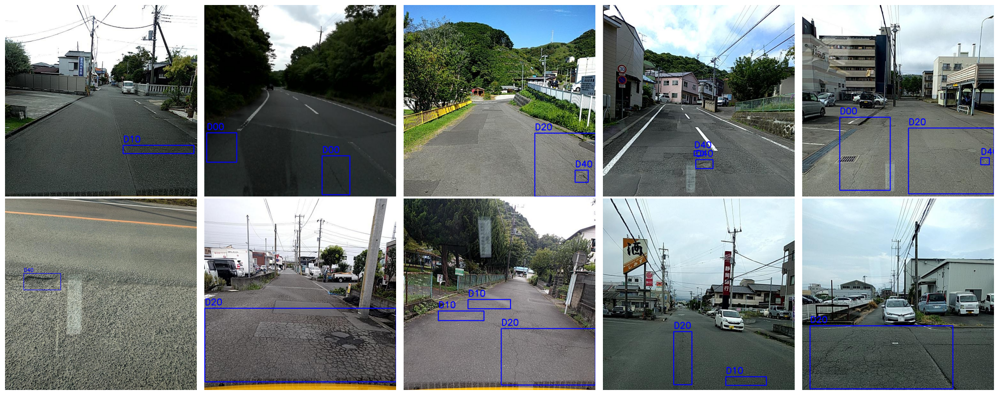

In [23]:
def draw_bounding_boxes(image_path, annotations):
    image = cv2.imread(image_path)
    for (label, xmin, ymin, xmax, ymax) in annotations:
        if label in include_labels:
            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
            cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image_rgb

# Sample 10 images
sample_indices = np.random.choice(len(image_list), 10, replace=False)

# Create a 2x5 subplot
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()  # Flatten the axes array for easy iteration

for idx, ax in zip(sample_indices, axes):
    xml_file = annot_list[idx]
    img_file = image_list[idx]
    annotations = read_and_parse_xml(xml_file)
    objects = []
    for obj in annotations.findall('object'):
        label = obj.find('name').text
        if label in include_labels:
            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            objects.append((label, xmin, ymin, xmax, ymax))
    image = draw_bounding_boxes(img_file, objects)
    if image is not None:
        ax.imshow(image)
        ax.axis('off')

plt.tight_layout()
plt.show()

- The images above demonstrate various examples of road defects detected in our dataset. Each bounding box is labeled with the corresponding defect type.
- It is important to note that a single image can contain multiple labels. For example, an image may have both D00 (Longitudinal Crack) and D10 (Transverse Crack) defects, as shown in several images above.

## Calculate pHash for Each Image

In [24]:
# Calculate perceptual hash for each image
def calculate_perceptual_hash(image_path):
    image = Image.open(image_path)
    return imagehash.phash(image)

def calculate_hashes(image_list):
    hashes = []
    for img_file in image_list:
        hash_value = calculate_perceptual_hash(img_file)
        hashes.append(hash_value)
    return hashes

# Calculate perceptual hash for each image in the filtered list
hashes = calculate_hashes(image_list)

# Add the perceptual hash as a new column to the DataFrame
df_filtered['phash'] = hashes

# Display first 5 rows of the updated DataFrame
df_filtered.head()

,xml_file_path,objects,D00,D10,D20,D40,image_path,phash
0,../data-collection\filtered\annotations\Japan_...,[D00],1,0,0,0,../data-collection\filtered\images\Japan_00010...,c9b2bc2e2059ddd4
1,../data-collection\filtered\annotations\Japan_...,[D20],0,0,1,0,../data-collection\filtered\images\Japan_00008...,d6d696cc2c393d88
2,../data-collection\filtered\annotations\Japan_...,"[D20, D20, D00, D10]",1,1,2,0,../data-collection\filtered\images\Japan_00004...,d6ec830372fd4519
3,../data-collection\filtered\annotations\Japan_...,[D20],0,0,1,0,../data-collection\filtered\images\Japan_00009...,991ea2e5792b1e58
4,../data-collection\filtered\annotations\Japan_...,[D20],0,0,1,0,../data-collection\filtered\images\Japan_00010...,d4bab1cfec460343


In [67]:
# Convert perceptual hash to string for comparison
df_filtered['phash_str'] = df_filtered['phash'].astype(str)

# Find the unique phash values and their counts
unique_phash_counts = df_filtered['phash_str'].value_counts()

# Display the number of unique phash values
print(f"Number of unique phash values: {unique_phash_counts.size}")

# Display the first 5 unique phash values and their counts
print(unique_phash_counts.head())

# If you want to see the DataFrame with unique phash values
unique_phash_df = df_filtered.drop_duplicates(subset=['phash_str'])
print(unique_phash_df.head())

Number of unique phash values: 4129
phash_str
94c0e1717a5e9f8c    3
b0b0b2d7cf4ecc0c    2
919b5ee9819ed831    2
8090afaf60439fbd    1
d6ec830372fd4519    1
Name: count, dtype: int64
                                       xml_file_path  \
2  ../data-collection\filtered\annotations\Japan_...   
3  ../data-collection\filtered\annotations\Japan_...   
4  ../data-collection\filtered\annotations\Japan_...   
6  ../data-collection\filtered\annotations\Japan_...   
7  ../data-collection\filtered\annotations\Japan_...   

                                             objects  D00  D10  D20  D40  \
2                                         [D20, D10]    0    1    1    0   
3  [D40, D40, D40, D40, D20, D10, D10, D10, D10, ...    0    5    1    4   
4                                              [D40]    0    0    0    1   
6                                              [D20]    0    0    1    0   
7                                              [D20]    0    0    1    0   

                        

- After generating perceptual hash values for all images in the dataset, we observed that the majority of the images have unique hash values. Specifically, there are a total of 4129 unique perceptual hash values. This indicates a high level of diversity in the visual content of the images. Only a few hash values are duplicated.


## Calculate Hamming Distance

In [68]:
# Function to calculate Hamming distance
def hamming_distance(hash1, hash2):
    return np.sum(hash1.hash != hash2.hash)

# Calculate Hamming distance
distances = []
for i in range(len(hashes)):
    for j in range(i + 1, len(hashes)):
        distance = hamming_distance(hashes[i], hashes[j])
        distances.append((i, j, distance))

# Display first 10 distances as an example
print(distances[:10])

[(0, 1, np.int64(26)), (0, 2, np.int64(34)), (0, 3, np.int64(30)), (0, 4, np.int64(32)), (0, 5, np.int64(34)), (0, 6, np.int64(32)), (0, 7, np.int64(30)), (0, 8, np.int64(28)), (0, 9, np.int64(34)), (0, 10, np.int64(26))]


## Distribution of Hamming Distances

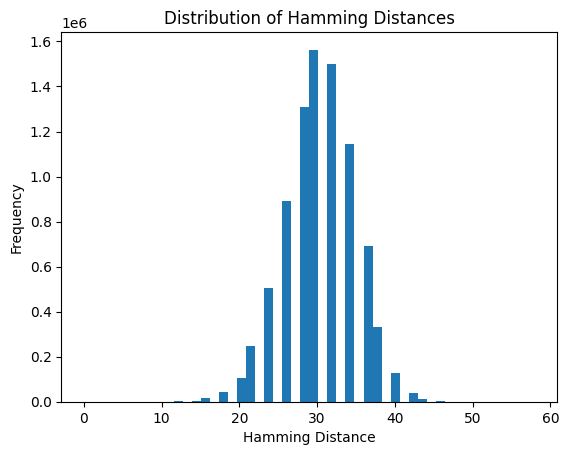

In [69]:
# Extract distances
distance_values = [d[2] for d in distances]

# Plot histogram
plt.hist(distance_values, bins=50)
plt.title("Distribution of Hamming Distances")
plt.xlabel("Hamming Distance")
plt.ylabel("Frequency")
plt.show()

- The Hamming distance between perceptual hashes of images was calculated to assess the similarity between images in the dataset. The distribution of these Hamming distances provides insights into the overall similarity between the images.

- The plot shows the frequency of different Hamming distances observed in the dataset. The majority of the distances are clustered around 30, indicating that most images have a moderate level of similarity. There are fewer instances of very low or very high Hamming distances, suggesting that exact duplicates or completely dissimilar images are rare in the dataset.

## Visualize Similar Images

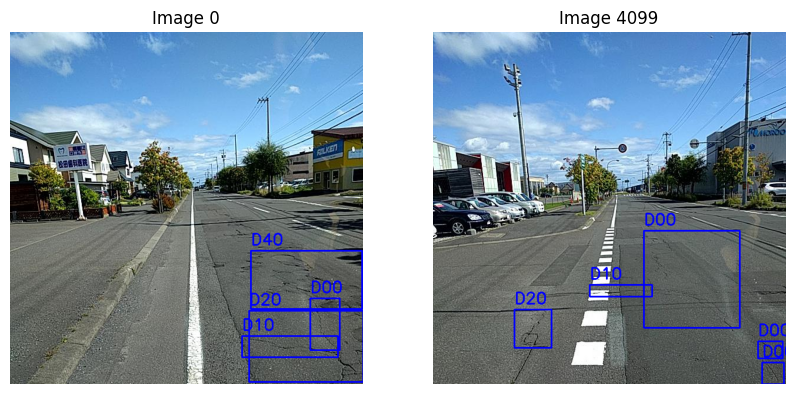

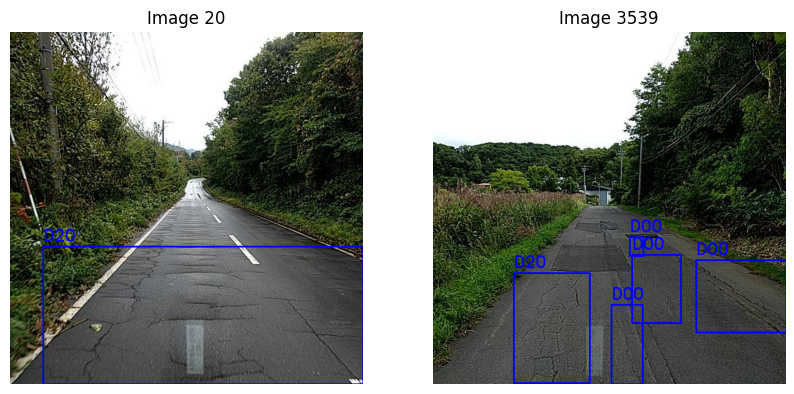

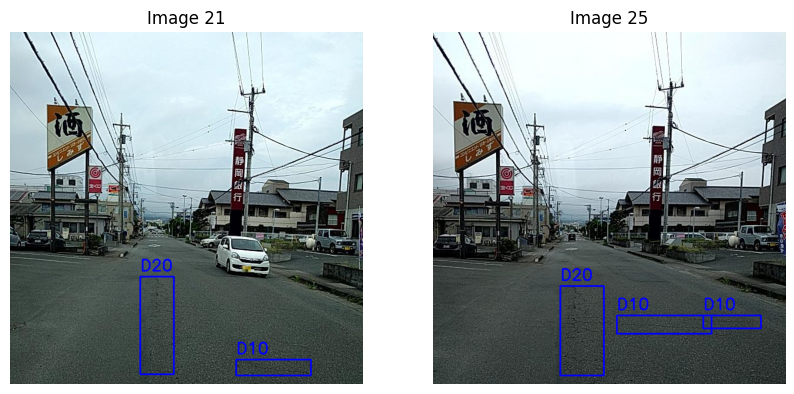

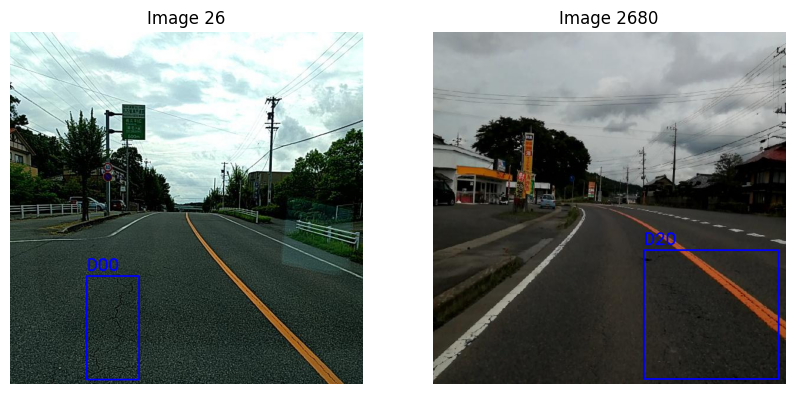

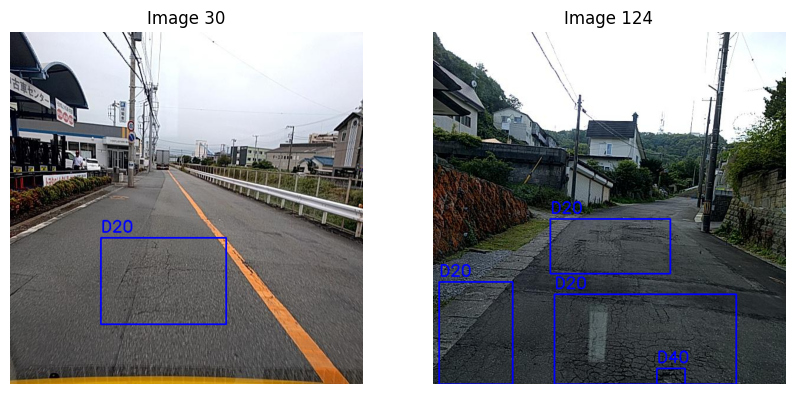

In [70]:
# Function to find similar images
def find_similar_images(hashes, threshold=10):
    similar_images = []
    for i in range(len(hashes)):
        for j in range(i + 1, len(hashes)):
            if hamming_distance(hashes[i], hashes[j]) <= threshold:
                similar_images.append((i, j))
    return similar_images

# Function to get annotations for an image
def get_annotations_for_image(xml_file):
    annotations = read_and_parse_xml(xml_file)
    objects = []
    for obj in annotations.findall('object'):
        label = obj.find('name').text
        if label in include_labels:
            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            objects.append((label, xmin, ymin, xmax, ymax))
    return objects

# Function to draw bounding boxes using annotation data
def draw_bounding_boxes(image_path, annotations):
    image = cv2.imread(image_path)
    for (label, xmin, ymin, xmax, ymax) in annotations:
        if label in include_labels:
            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
            cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Find similar images
similar_images = find_similar_images(hashes)

# Visualize similar images with bounding boxes
for pair in similar_images[:5]:  # Display the first 5 pairs of similar images
    img1_file = image_list[pair[0]]
    img2_file = image_list[pair[1]]
    xml1_file = annot_list[pair[0]]
    xml2_file = annot_list[pair[1]]
    
    annotations1 = get_annotations_for_image(xml1_file)
    annotations2 = get_annotations_for_image(xml2_file)
    
    img1 = draw_bounding_boxes(img1_file, annotations1)
    img2 = draw_bounding_boxes(img2_file, annotations2)
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img1)
    plt.title(f"Image {pair[0]}")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img2)
    plt.title(f"Image {pair[1]}")
    plt.axis('off')
    
    plt.show()

The below analysis performed on the dataset aims to understand the distribution and relationships between different types of road defects (D00, D10, D20, D40) in terms of their annotation counts and image characteristics

## Normality Test

In [71]:
# Shapiro-Wilk normality test for each label
def test_shapiro_normality(df, labels):
    normality_results = {}
    for label in labels:
        data = df[label]
        normality_results[label] = shapiro(data)
    return normality_results

labels = ['D00', 'D10', 'D20', 'D40']
shapiro_normality_results = test_shapiro_normality(df_filtered, labels)
shapiro_normality_results

{'D00': ShapiroResult(statistic=np.float64(0.6223737502391349), pvalue=np.float64(6.970226448931374e-70)),
 'D10': ShapiroResult(statistic=np.float64(0.5543592780481337), pvalue=np.float64(3.053546959460096e-73)),
 'D20': ShapiroResult(statistic=np.float64(0.7990720228637247), pvalue=np.float64(7.921614791815635e-58)),
 'D40': ShapiroResult(statistic=np.float64(0.46946011312400926), pvalue=np.float64(7.263086945046302e-77))}

#### Hypothesis
**Null Hypothesis (H0):** The data distributions for the road damage categories (D00, D10, D20, D40) follow a normal distribution.

**Alternative Hypothesis (H1):** The data distributions for the road damage categories (D00, D10, D20, D40) do not follow a normal distribution.

**Conclusion**<br>
- Since the p-values for all labels are less than 0.05, we reject the null hypothesis (H0) for each label. 
- This means that the data distributions for the road damage categories (D00, D10, D20, D40) do not follow a normal distribution.
- Given that the data does not follow a normal distribution, non-parametric tests are more appropriate for further analysis.

## Correlation Test

### Spearman

In [72]:
# Calculate Spearman correlation for each pair of labels
def calculate_spearman_correlation(df, labels):
    correlation_matrix = pd.DataFrame(index=labels, columns=labels)
    for label1 in labels:
        for label2 in labels:
            correlation, p_value = spearmanr(df[label1], df[label2])
            correlation_matrix.loc[label1, label2] = correlation
    return correlation_matrix

spearman_correlation_matrix = calculate_spearman_correlation(df_filtered, labels)
spearman_correlation_matrix

,D00,D10,D20,D40
D00,1.0,0.090134,-0.45622,-0.256054
D10,0.090134,1.0,-0.151428,-0.176229
D20,-0.45622,-0.151428,1.0,-0.016411
D40,-0.256054,-0.176229,-0.016411,1.0


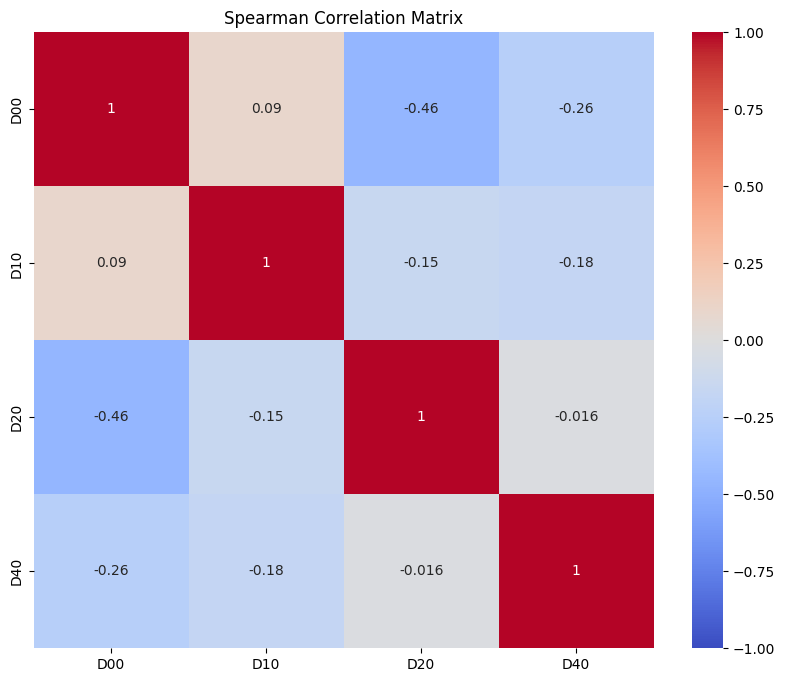

In [73]:
plt.figure(figsize=(10, 8))
sns.heatmap(spearman_correlation_matrix.astype(float), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Spearman Correlation Matrix')
plt.show()

- There is a moderate negative correlation between D00 and D20, indicating that as D00 increases, D20 tends to decrease.

- There is a weak negative correlation between D00 and D40, and between D10 and D40.

- There is very weak or almost no correlation between D00 and D10, D10 and D20, and D20 and D40.

- The negative correlations suggest that certain defect types tend not to co-occur in the same images.

- The lack of strong correlations indicates that the defect types may appear independently in the dataset.

### Wilcoxon

In [74]:
# Wilcoxon test for each pair of labels
def perform_wilcoxon_test(df, labels):
    wilcoxon_results = {}
    for i, label1 in enumerate(labels):
        for label2 in labels[i+1:]:
            stat, p_value = wilcoxon(df[label1], df[label2])
            wilcoxon_results[(label1, label2)] = (stat, p_value)
    return wilcoxon_results

wilcoxon_results = perform_wilcoxon_test(df_filtered, labels)
wilcoxon_results


{('D00', 'D10'): (np.float64(845185.0), np.float64(0.7131742506967081)),
 ('D00', 'D20'): (np.float64(1851879.0), np.float64(1.381461263332119e-67)),
 ('D00', 'D40'): (np.float64(862657.5), np.float64(7.052025583974032e-16)),
 ('D10', 'D20'): (np.float64(1343595.0), np.float64(3.65082015681691e-69)),
 ('D10', 'D40'): (np.float64(642443.5), np.float64(3.0758076566013334e-14)),
 ('D20', 'D40'): (np.float64(755871.0), np.float64(1.6417477144947343e-166))}

#### Hypothesis
**Null Hypothesis (H0):** There is no significant difference in the distribution of annotation counts between different road damage types (D00, D10, D20, D40).

**Alternative Hypothesis (H1):** There is a significant difference in the distribution of annotation counts between different road damage types (D00, D10, D20, D40).

**Conclusion**

- There is no significant difference between D00 and D10, as indicated by the high p-value.
- Significant differences exist between all other pairs of labels, as indicated by the very low p-values.
- The significant differences between most pairs of defect types indicate that the distribution of annotation counts varies significantly between different defect types.

## Conclusion

Given the significant differences observed in most pairs, the analysis suggests that the distribution of annotation counts differs considerably between these defect types. This reinforces the conclusion that these defect types have distinct characteristics in terms of their annotation counts.

These findings are crucial for our project's goal of effectively detecting and addressing road damage. Understanding that different defect types exhibit distinct patterns in their annotation counts allows us to tailor our detection models more precisely, improving their accuracy and reliability. By accurately identifying and categorizing road damage, we can prioritize maintenance efforts, ultimately reducing personal and national costs associated with road damage. This analysis lays a solid foundation for developing robust machine learning models that can make our road infrastructure safer and more cost-effective to maintain.